In [1]:
#Enable jupyter notebook to display animations
%matplotlib notebook
import time #Library for getting time
import tracemalloc #Library for tracking memory usage
from environment2 import Environment

In [2]:
class DfsAgent:
    #Defining default values in constructor
    def __init__(self, environment):
        self.env = environment
    '''
    Creating a DFS search algorithm to find tap with water.
    We track movements for display by appending each paths taken to all_movements.
    '''
    def dfs_to_water(self, node, has_water, visited, path, all_movements, depth=0, all_paths=[]):
        path.append(node)
        all_movements.append(node)  
        all_paths.append(list(path)) 
        if node in has_water:
            return True, depth
        visited.add(node)
        max_depth = depth
        for neighbor in self.env.graph[node]:
            if neighbor == 17 or neighbor == 33 or neighbor == 45: 
                continue
            if neighbor not in visited:
                found_water, depth_reached = self.dfs_to_water(neighbor, has_water, visited, list(path), all_movements, depth + 1, all_paths)
                max_depth = max(max_depth, depth_reached)
                if found_water:
                    return True, max_depth 
        return False, max_depth 
    
    '''
    The following function is used to keep track of all metrics and store the agent's movement for DFS
    '''
    def find_water_and_record_movements(self):
        visited = set()
        all_movements = []
        all_paths = []

        tracemalloc.start()
        start_time = time.perf_counter()

        water_found = False
        for start_node in self.env.graph.keys():
            if start_node == 17 or start_node == 33 or start_node == 45: 
                continue
            found_water, depth = self.dfs_to_water(start_node, self.env.taps_with_water, visited, [], all_movements, all_paths=all_paths)
            if found_water:
                water_found = True
                break

        end_time = time.perf_counter()
        current, peak = tracemalloc.get_traced_memory()
        tracemalloc.stop()
        time_taken = (end_time - start_time) * 1000
        node_count = len(all_movements)
        max_depth = max(len(path) for path in all_paths) - 1 
        return water_found, all_movements, time_taken, node_count, max_depth, peak
    
    '''
    The run method calls the environment function to print out the search results, 
    draws the animation of the movement. The animation is also saved to a file
    '''
    def run(self):
        water_found, all_movements, time_taken, node_count, max_depth, peak_memory = self.find_water_and_record_movements()
        
        self.all_movements = all_movements
        
        # Checking if tap with water was found in a recursive process
        if water_found:
            print("Water found! Paths:", all_movements)
        else:
            print("No path to water found.")
            
        self.env.display_animation(time_taken,node_count,max_depth,peak_memory,all_movements)

Water found! Paths: [1, 2, 3, 4, 9, 8, 7, 6, 11, 12, 13, 14, 15, 10, 5, 35]
Time taken: 0.56 milliseconds
Number of nodes visited: 16
Number of paths taken: 15
Maximum depth reached: 15
Peak memory usage: 5.72 KB
Loading Visuals...


<IPython.core.display.Javascript object>


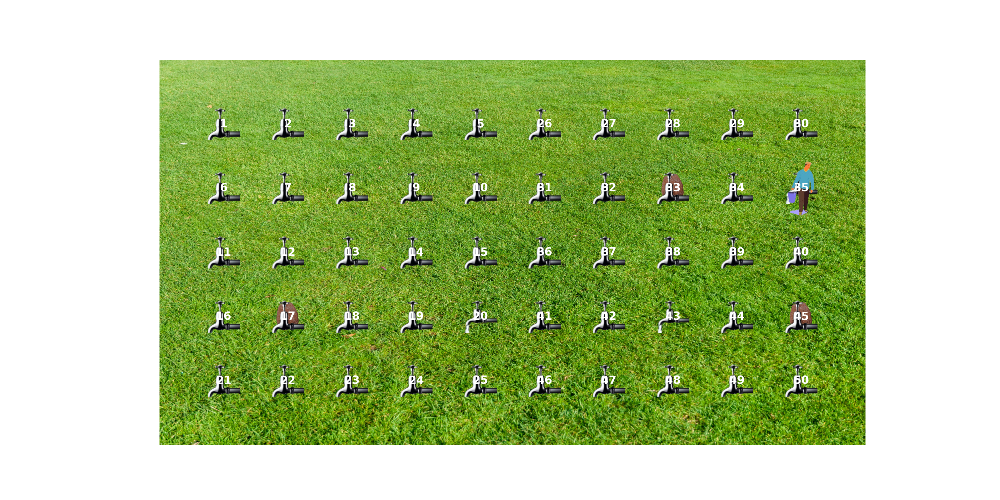

In [3]:
#Run DFS Agent
env = Environment({20,35,43}) #set nodes where running taps can exist
dfs_agent = DfsAgent(env)
dfs_agent.run()

In [ ]:
#Save file
env.save_animation(dfs_agent.all_movements,'dfs')